In [1]:
# Remember: library imports are ALWAYS at the top of the script, no exceptions!
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder, OrdinalEncoder
import category_encoders as ce
from pandas_profiling import ProfileReport
import datetime
import pandas_profiling
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')
pd.options.display.max_columns = None
pd.set_option('display.max_rows', 200)

In [2]:
data = pd.read_csv('donors.csv')
data.head(3)

,Unnamed: 0,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,NOEXCH,RECINHSE,RECP3,RECPGVG,RECSWEEP,MDMAUD,DOMAIN,HOMEOWNR,CHILD03,CHILD07,CHILD12,CHILD18,NUMCHLD,INCOME,GENDER,WEALTH1,HIT,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,DATASRCE,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,SOLP3,SOLIH,MAJOR,WEALTH2,GEOCODE,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,LIFESRC,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH8,ETH9,ETH10,ETH11,ETH12,ETH13,ETH14,ETH15,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE4,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_15,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_20,ADATE_21,ADATE_22,ADATE_23,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RDATE_3,RDATE_4,RDATE_5,RDATE_6,RDATE_7,RDATE_8,RDATE_9,RDATE_10,RDATE_11,RDATE_12,RDATE_13,RDATE_14,RDATE_15,RDATE_16,RDATE_17,RDATE_18,RDATE_19,RDATE_20,RDATE_21,RDATE_22,RDATE_23,RDATE_24,RAMNT_3,RAMNT_4,RAMNT_5,RAMNT_6,RAMNT_7,RAMNT_8,RAMNT_9,RAMNT_10,RAMNT_11,RAMNT_12,RAMNT_13,RAMNT_14,RAMNT_15,RAMNT_16,RAMNT_17,RAMNT_18,RAMNT_19,RAMNT_20,RAMNT_21,RAMNT_22,RAMNT_23,RAMNT_24,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
0,0,2009-01-01,GRI,0,IL,61081,,,1957-12-01,0,,,,,XXXX,T2,,,,,,NaN,NaN,F,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,0,39,34,18,10,2,1,,,,5.0,,,,,,,,,,,,,,,,,,,,,X,992,264,332,0,35,65,47,53,92,1,0,0,11,0,0,0,0,0,0,0,11,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,23,23,23,15,1,0,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,0,0,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,99,0,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,0,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,0,120,16,10,39,21,8,4,3,5,20,3,19,4,0,0,0,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,0,0,90,0,10,0,0,0,33,65,40,99,99,6,2,10,7,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,

In [3]:
data.drop(['Unnamed: 0'], axis=1, inplace=True)

In [4]:
data

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,NOEXCH,RECINHSE,RECP3,RECPGVG,RECSWEEP,MDMAUD,DOMAIN,HOMEOWNR,CHILD03,CHILD07,CHILD12,CHILD18,NUMCHLD,INCOME,GENDER,WEALTH1,HIT,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,DATASRCE,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,SOLP3,SOLIH,MAJOR,WEALTH2,GEOCODE,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,LIFESRC,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH8,ETH9,ETH10,ETH11,ETH12,ETH13,ETH14,ETH15,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE4,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_15,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_20,ADATE_21,ADATE_22,ADATE_23,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RDATE_3,RDATE_4,RDATE_5,RDATE_6,RDATE_7,RDATE_8,RDATE_9,RDATE_10,RDATE_11,RDATE_12,RDATE_13,RDATE_14,RDATE_15,RDATE_16,RDATE_17,RDATE_18,RDATE_19,RDATE_20,RDATE_21,RDATE_22,RDATE_23,RDATE_24,RAMNT_3,RAMNT_4,RAMNT_5,RAMNT_6,RAMNT_7,RAMNT_8,RAMNT_9,RAMNT_10,RAMNT_11,RAMNT_12,RAMNT_13,RAMNT_14,RAMNT_15,RAMNT_16,RAMNT_17,RAMNT_18,RAMNT_19,RAMNT_20,RAMNT_21,RAMNT_22,RAMNT_23,RAMNT_24,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
0,2009-01-01,GRI,0,IL,61081,,,1957-12-01,0,,,,,XXXX,T2,,,,,,NaN,NaN,F,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,0,39,34,18,10,2,1,,,,5.0,,,,,,,,,,,,,,,,,,,,,X,992,264,332,0,35,65,47,53,92,1,0,0,11,0,0,0,0,0,0,0,11,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,23,23,23,15,1,0,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,0,0,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,99,0,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,0,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,0,120,16,10,39,21,8,4,3,5,20,3,19,4,0,0,0,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,0,0,90,0,10,0,0,0,33,65,40,99,99,6,2,10,7,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,20

In [5]:
data.shape[0]


95412

In [6]:
df = data.copy() 

In [7]:
any(df.duplicated())

False

In [8]:
df.drop(df.loc[df['MAILCODE']=='B'].index, inplace=True)
df.drop(['MAILCODE'], axis = 1, inplace = True)

In [9]:
df.shape[0]/data.shape[0]

0.9853372741374251

In [10]:
df.drop(['DATASRCE', 'LIFESRC', 'NOEXCH', 'WEALTH1', ], axis = 1, inplace = True) 

In [11]:
df.drop(df.loc[df['SOLP3']=='00'].index, inplace=True)
df.drop(df.loc[df['SOLIH']=='00'].index, inplace=True)

In [12]:
df.shape[0]/data.shape[0]

0.9817737810757556

In [13]:
df['DOB'] = 2017 - df['DOB'].str[:4].fillna(0).astype(int)
df['DOB'] = df['DOB'].replace(2017, np.nan)


In [14]:
df['DOB'].isna().sum()

23292

In [15]:
df=df.rename(columns={'DOB':'AGE'}) 

In [16]:
df['ETH4']= df['ETH12']+ df['ETH4']
df['ETH5']= df['ETH5']+df['ETH13']+ df['ETH14']+ df['ETH15']
df['ETH6']= df['ETH6']+df['ETH8']+ df['ETH9']+ df['ETH10']
df.drop(['ETH12', 'ETH13', 'ETH14', 'ETH15', 'ETH8', 'ETH9', 'ETH10'], axis = 1, inplace = True)

In [17]:
df['IC7']= df['IC7']+df['IC8']
df['IC8']= df['IC9']+df['IC10']
df['IC9']= df['IC11']+df['IC12']
df.drop(['IC10', 'IC11', 'IC12'], axis = 1, inplace = True)

In [18]:
df = df[df.POP901 >0] #it must have at least someone 

In [19]:
df.shape[0]/data.shape[0]

0.9737139982392152

In [20]:
df.drop(['TPE4', 'TPE5', 'TPE6', 'TPE7', 'EIC2', 'OEDC7', 'AFC1', 'AFC2', 'AFC3','HC9','HC10','HC15'], axis=1, inplace=True) #large number of zeros

In [21]:
df.drop(['LFC8', 'LFC9'], axis=1, inplace=True) #many extreme percentages 0 and 100% 

In [22]:
df.drop('GEOCODE2', axis=1, inplace=True) #we have no information of what the codes mean

In [23]:
df.drop(['RECINHSE', 'RECP3', 'RECPGVG', 'RECSWEEP', 'PVASTATE','SOLP3', 'SOLIH', 'GEOCODE'], axis=1, inplace=True) #too many null values (not defined as nan by default)

In [24]:
df.drop(['RFA_2R'], axis=1, inplace=True) #RFA_2R - constant value

In [25]:
df=df.reset_index(drop=True)
for index in range(len(df)):
    if pd.isna(df['NUMCHLD'][index]):
        if ((df['CHILD03'][index]==' ' and df['CHILD07'][index]==' ') and (df['CHILD12'][index]==' ' and df['CHILD18'][index]==' ')):
            df['NUMCHLD'][index] = 0
            
df.drop(['CHILD03', 'CHILD07','CHILD12','CHILD18'], axis=1, inplace=True)

In [26]:
df.NUMCHLD.isna().sum()

1525

In [27]:
df[['ZIP','null']] = df.ZIP.str.split("-",1, expand=True)
df.drop(['null'], axis=1, inplace=True)
df.ZIP = df.ZIP.astype('int')

In [28]:
percent_missing = df.isnull().sum() * 100 / len(df)
missing_value_df = pd.DataFrame({'column_name': df.columns,
                                 'percent_missing': percent_missing})
for index in range(len(missing_value_df)):
    if missing_value_df['percent_missing'][index]>=45:
        df.drop(missing_value_df['column_name'][index], axis=1, inplace=True)
df  

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,AGE,MDMAUD,DOMAIN,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH11,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC11,HC12,HC13,HC14,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_21,ADATE_22,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A
0,2009-01-01,GRI,0,IL,61081,60.0,XXXX,T2,,0.0,NaN,F,0,0,39,34,18,10,2,1,,,,,,,,,,,,,,,,,,,,X,992,264,332,0,35,65,47,53,92,1,0,0,22,0,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,46,38,1,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,120,16,10,39,21,8,4,3,5,20,3,19,4,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,90,0,10,0,0,33,65,40,99,99,6,2,10,7,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,2015-10-01,2015-10-01,2015-08-01,2015-07-01,2015-06-01,2015-03-01,2015-02-01,2015-01-01,2014-11-01,2014-10-01,2014-09-01,2014-06-01,L4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,27,2017-02-01,74,6,14,240.0,31,14,5.0,2012-08-01,12.0,2014-02-01,10.0,2015-12-01,2009-11-01,2010-03-01,4.0,7.741935,95515,0,4,E,X,X,X
1,2014-01-01,BOA,1,CA,91326,45.0,XXXX,S1,H,1.0,6.0,M,16,0,15,55,11,6,2,1,,,,,,,,,,,,,,,,,,,,,3611,940,998,99,0,0,50,50,67,0,0,31,9,28,2,0,4,34,41,43,32,42,45,32,33,46,21,13,14,33,23,10,4,2,11,16,36,22,15,12,1,5,4,21,75,55,23,9,69,4,3,24,317,360,99,99,0,0,0,0,0,0,0,5468,5218,12,10,96,4,97,3,9,59,94,88,55,95,5,4,1,3,5,4,2,18,44,5,0,0,0,97,98,98,98,99,94,0,83,76,73,21,5,0,0,0,4,0,0,0,91,91,91,94,4480.0,13.0,803.0,1088,1096,1026,1037,36175,2,8,20,27,10,33,2,5,2,5,15,14,14,10,32,6,2,66,3,56,44,9,80,14,0,0,6,0,2,24,32,12,71,70,83,58,81,57,64,57,0,22,24,4,21,13,2,1,6,0,4

In [29]:
#find which columns represent booleans
bools=[]
for col in df:
    if len(df[col].unique()) == 2:
        bools.append(col)

#find wich columns are dates
dates = df.filter(like='DATE').columns

#tranform those dates into datetime and then into days
df[dates] = df[dates].apply(pd.to_datetime)
df[dates] = (datetime(2017, 12, 31) - df[dates]) #CONFIRMAR ESTE DIA
df[dates]= df[dates].astype('timedelta64[D]')

#transform booleans to binary
df[bools]=df[bools].replace([' ','U'],0)
df[bools]=df[bools].replace(['X','Y','H'],1)
df

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,AGE,MDMAUD,DOMAIN,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH11,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC11,HC12,HC13,HC14,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_21,ADATE_22,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A
0,3286.0,GRI,0,IL,61081,60.0,XXXX,T2,,0.0,NaN,F,0,0,39,34,18,10,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,992,264,332,0,35,65,47,53,92,1,0,0,22,0,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,46,38,1,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,120,16,10,39,21,8,4,3,5,20,3,19,4,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,90,0,10,0,0,33,65,40,99,99,6,2,10,7,213.0,578.0,639.0,639.0,670.0,699.0,730.0,791.0,822.0,822.0,883.0,914.0,944.0,1036.0,1064.0,1095.0,1156.0,1187.0,1217.0,1309.0,L4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,27,333.0,74,6,14,240.0,31,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2982.0,2862.0,4.0,7.741935,95515,0,4,E,X,X,X
1,1460.0,BOA,1,CA,91326,45.0,XXXX,S1,H,1.0,6.0,M,16,0,15,55,11,6,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3611,940,998,99,0,0,50,50,67,0,0,31,9,28,2,0,4,34,41,43,32,42,45,32,33,46,21,13,14,33,23,10,4,2,11,16,36,22,15,12,1,5,4,21,75,55,23,9,69,4,3,24,317,360,99,99,0,0,0,0,0,0,0,5468,5218,12,10,96,4,97,3,9,59,94,88,55,95,5,4,1,3,5,4,2,18,44,5,0,0,0,97,98,98,98,99,94,0,83,76,73,21,5,0,0,0,4,0,0,0,91,91,91,94,4480.0,13.0,803.0,1088,1096,1026,1037,36175,2,8,20,27,10,33,2,5,2,5,15,14,14,10,32,6,2,66,3,56,44,9,80,14,0,0,6,0,2,24,32,12,71,70,83,58,81,57,64,57,0,22,24,4,21,13,2,1,6,0,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,160,5,5,12,21,7,30,20,14,24,4,24

In [30]:
#turn variables into binary
bols = ['HOMEOWNR']
df[bols]=df[bols].replace([' ','U'],0)
df[bols]=df[bols].replace(['H'],1)
df

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,AGE,MDMAUD,DOMAIN,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH11,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC11,HC12,HC13,HC14,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_21,ADATE_22,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A
0,3286.0,GRI,0,IL,61081,60.0,XXXX,T2,0,0.0,NaN,F,0,0,39,34,18,10,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,992,264,332,0,35,65,47,53,92,1,0,0,22,0,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,46,38,1,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,120,16,10,39,21,8,4,3,5,20,3,19,4,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,90,0,10,0,0,33,65,40,99,99,6,2,10,7,213.0,578.0,639.0,639.0,670.0,699.0,730.0,791.0,822.0,822.0,883.0,914.0,944.0,1036.0,1064.0,1095.0,1156.0,1187.0,1217.0,1309.0,L4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,27,333.0,74,6,14,240.0,31,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2982.0,2862.0,4.0,7.741935,95515,0,4,E,X,X,X
1,1460.0,BOA,1,CA,91326,45.0,XXXX,S1,1,1.0,6.0,M,16,0,15,55,11,6,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3611,940,998,99,0,0,50,50,67,0,0,31,9,28,2,0,4,34,41,43,32,42,45,32,33,46,21,13,14,33,23,10,4,2,11,16,36,22,15,12,1,5,4,21,75,55,23,9,69,4,3,24,317,360,99,99,0,0,0,0,0,0,0,5468,5218,12,10,96,4,97,3,9,59,94,88,55,95,5,4,1,3,5,4,2,18,44,5,0,0,0,97,98,98,98,99,94,0,83,76,73,21,5,0,0,0,4,0,0,0,91,91,91,94,4480.0,13.0,803.0,1088,1096,1026,1037,36175,2,8,20,27,10,33,2,5,2,5,15,14,14,10,32,6,2,66,3,56,44,9,80,14,0,0,6,0,2,24,32,12,71,70,83,58,81,57,64,57,0,22,24,4,21,13,2,1,6,0,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,160,5,5,12,21,7,30,20,14,24,4,2

In [31]:
df.drop(['MALEMILI','MALEVET','VIETVETS','WWIIVETS','LOCALGOV','STATEGOV','FEDGOV'], axis=1, inplace=True) #not related to the census, can't really understand to each population it refers to 

In [89]:

def DescribeFeatures(Features, dataset):
    Head =['Count', 'Missing Values (%)', 'Cardinality']
    Describe = pd.DataFrame(index=Features, columns=Head)
    Describe.index.name = 'Feature Name'
    columns = dataset[Features]
    #Total Number of Instances
    Describe[Head[0]] = columns.count()
    #Percentage of instances that has Missing Values (sabendo à partida que nenhuma variável contínua tem missings)
    Describe[Head[1]] = columns.isnull().sum() * 100 / len(dataset)

#Cardinality of each feature (cardinality measures the number of Distinct Values)
    Describe[Head[2]] = columns.nunique()
    return Describe



In [32]:
blacklist=[]
corr_matrix=df.corr()
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[j, i]) > 0.85:
            colname = corr_matrix.columns[i]
            rowname = corr_matrix.columns[j]
            
            if colname in blacklist or rowname in blacklist:
                continue
            list1 = []
            list2 = []
            for k, index in enumerate(corr_matrix[colname]):
                if(corr_matrix.columns[k] not in blacklist):
                    list1.append(1-abs(index)) 
            for k, index in enumerate(corr_matrix[rowname]):
                if(corr_matrix.columns[k] not in blacklist):
                    list2.append(1-abs(index))
            if sum(list1)>sum(list2):
                blacklist.append(colname)
                df.drop(colname, axis=1, inplace=True)

            else:
                blacklist.append(rowname)
                df.drop(rowname, axis=1, inplace=True)
                
for column in corr_matrix.columns:
    if (corr_matrix[column]< 0.1).all() is True:
        corr_matrix.drop(column, axis=1, inplace=True)
        df.drop(column, axis=1, inplace=True)

In [33]:
df.drop(df.loc[:,'ADATE_2':'RFA_24'], axis=1, inplace =True)   
#RFA has a high degree of cardinality
#we have other more important dates than to know for each gift

In [34]:
df.drop(['OSOURCE', 'DOMAIN', 'MDMAUD'], axis=1, inplace=True) #high cardinality

#Domain has other variables that explain this, is redundant 
#MDMAUD we have other values that contain this information (the other MDMAUD_)

In [35]:
df.drop(['HVP5',  # we already have the median home value, it's skewed
         'IC7','IC8', 'IC16', 'IC17', 'IC18', 'IC19','IC20','IC21','IC23','IC22',  #we have the income per capita and other values that explain this
         'TPE11'], axis=1, inplace=True)  #drop the average bc we have the median and it's slightly skewed

In [36]:
df.drop(['HHD11',  #we have hhd10 and hhd3, redundant
         'ETHC1','ETHC2','ETHC3','ETHC5','ETHC6'], axis=1, inplace=True)   #we have other variables that explain this information

In [37]:
df.drop(['TCODE', 'HPHONE_D'], axis=1, inplace=True)

In [39]:
df.drop(['MDMAUD_F', 'MDMAUD_R', 'MDMAUD_A'], axis=1, inplace=True) 

In [40]:
df

,STATE,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A
0,IL,60.0,0,0.0,NaN,F,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,0.0,177.0,682.0,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,E
1,CA,45.0,1,1.0,6.0,M,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,0,4,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,4480.0,13.0,803.0,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,G
2,NC,NaN,0,0.0,3.0,M,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,0.0,281.0,518.0,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,E
3,CA,69.0,0,0.0,1.0,F,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,0,1,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,9340.0,67.0,862.0,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,E
4,FL,77.0,1,1.0,3.0,F,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,5000.0,127.0,528.0,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,3,12,5,2,26,1,20,7,28,4,9,16,53,20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,65,0,0,0,90,45,18,25,0,3,67,9,14,72,3,0,1,21,99,96,6,2,7,11,333.0,10

In [41]:
df_ = df.replace(' ', np.nan)  

In [42]:
df_.GENDER.value_counts()

F    50000
M    38052
U     1673
J      357
A        2
C        2
Name: GENDER, dtype: int64

In [43]:
df_.GENDER.fillna('U', inplace = True)  

df_.drop(df_[df_.GENDER == 'C'].index, inplace=True)  #in metadata there is no reference to these two values
df_.drop(df_[df_.GENDER == 'A'].index, inplace=True)  

In [44]:
df_.GENDER = df_.GENDER.replace(['F'],0)
df_.GENDER = df_.GENDER.replace(['M'],1)
df_.GENDER = df_.GENDER.replace(['U','J'],2)

### Encode variables

In [48]:
df_.RFA_2A.value_counts()

F    45838
E    21083
G    18743
D     7236
Name: RFA_2A, dtype: int64

In [49]:
 # create object of Ordinalencoding to deal with the variable education level
encoder= ce.OrdinalEncoder(cols=['RFA_2A'],return_df=True,
                           mapping=[{'col':'RFA_2A',
'mapping':{'D':0, 'E':1, 'F':2, 'G':3}}])

#fit and transform train data 
df_transformed = encoder.fit_transform(df_)
#check
df_transformed.RFA_2A.value_counts() 

2    45838
1    21083
3    18743
0     7236
Name: RFA_2A, dtype: int64

In [50]:
#keep only the top 5 states
df_transformed.STATE = df_transformed.STATE.replace(['NC', 'AL', 'IN', 'LA', 'IA', 'TN', 'KS', 'MN',
       'UT', 'MO', 'OR', 'WA', 'WI', 'GA', 'OK', 'KY', 'MD',
       'SD', 'NV', 'NE', 'AZ', 'VA', 'SC', 'ND', 'AK', 'AR', 'NM', 'MT',
       'MS', 'CO', 'HI', 'ME', 'WY', 'ID', 'OH', 'NJ', 'MA', 'VT', 'NY',
       'PA', 'DC', 'CT', 'DE', 'WV', 'RI', 'AA', 'NH'],'Others')

#'IL', 'CA', 'FL', 'TX', 'MI'

In [52]:
df_transformed.STATE.value_counts()

Others    48646
CA        16991
FL         8154
TX         7284
IL         6293
MI         5532
Name: STATE, dtype: int64

In [58]:
df_ohc= df_transformed.copy()

one_hot_feat= ["STATE"]
ohc= OneHotEncoder(sparse=False)
ohc_feat= ohc.fit_transform(df_ohc[one_hot_feat])
ohc_feat_names= ohc.get_feature_names(["STATE"])
ohc_df = pd.DataFrame(ohc_feat, index=df_ohc.index, columns=ohc_feat_names)
df_ohc = pd.concat([df_ohc.drop(columns=one_hot_feat), ohc_df], axis=1)

In [59]:
df_ohc

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,0.0,177.0,682.0,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,1,0.0,0.0,1.0,0.0,0.0,0.0
1,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,0,4,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,4480.0,13.0,803.0,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,3,1.0,0.0,0.0,0.0,0.0,0.0
2,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,0.0,281.0,518.0,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,1,0.0,0.0,0.0,0.0,1.0,0.0
3,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,0,1,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,9340.0,67.0,862.0,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,1,1.0,0.0,0.0,0.0,0.0,0.0
4,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,5000.0,127.0,528.0,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,

In [60]:
df_=df_ohc.copy()

### Imputation of the nan values and normalization

In [61]:
numeric_data = df_.select_dtypes(include=[np.number]).columns.to_list()
categorical_data = df_.columns.drop(numeric_data).to_list()

In [63]:
df_[numeric_data]

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,0.0,177.0,682.0,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,1,0.0,0.0,1.0,0.0,0.0,0.0
1,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,0,4,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,4480.0,13.0,803.0,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,3,1.0,0.0,0.0,0.0,0.0,0.0
2,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,0.0,281.0,518.0,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,1,0.0,0.0,0.0,0.0,1.0,0.0
3,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,0,1,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,9340.0,67.0,862.0,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,1,1.0,0.0,0.0,0.0,0.0,0.0
4,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,5000.0,127.0,528.0,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,

In [64]:
df_[numeric_data].isna().sum()

AGE             22915
HOMEOWNR            0
NUMCHLD          1525
INCOME          20304
GENDER              0
                ...  
STATE_FL            0
STATE_IL            0
STATE_MI            0
STATE_Others        0
STATE_TX            0
Length: 216, dtype: int64

In [ ]:
import numpy as np
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
imp_mean = IterativeImputer(random_state=0)
df_complete = imp_mean.fit_transform(df_[numeric_data])
df_[numeric_data] = df_complete

In [ ]:
df_

In [ ]:
#arrendondar unidade

In [284]:
std_data=df_.copy()

In [287]:
numeric_data.remove('CONTROLN')

The reason why we decided to use robust scaler.
1st scale the data
2nd eliminate outliers. 
Depois no report explicar que este é o mais indicado para se tratar dos outliers.

https://www.kaggle.com/mikalaichaly/compare-different-scalers-on-data-with-outliers

In [227]:
from sklearn.preprocessing import RobustScaler

In [288]:
std_data.reset_index(drop=True, inplace=True)

In [289]:
#from sklearn.preprocessing import MinMaxScaler   #fazer com o outro  ROBUSTSCALER E DEPOIS OUTLIERS
scaler = RobustScaler()
std_data[numeric_data] = pd.DataFrame(scaler.fit_transform(std_data[numeric_data]), columns = numeric_data)
std_data

,TCODE,STATE,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A
0,-0.5,IL,0.073944,-1.0,0.0,-0.343742,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.0,-0.5,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.493677,-0.472700,-0.552850,95515.0,-1.0,1.5,E,0.0,0,0.0
1,0.0,CA,-0.676056,0.0,1.0,0.753623,1.0,5.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,0.0,1.5,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25,0.0,0.0,0.5,-0.333333,-0.6,0.714286

In [290]:
std_data.set_index(['CONTROLN'],inplace=True) #unique number 

#meter no df_ depois dos outliers tambem

In [291]:
std_data

,TCODE,STATE,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,HPHONE_D,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515.0,-0.5,IL,0.073944,-1.0,0.0,-0.343742,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.0,-0.5,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.493677,-0.472700,-0.552850,-1.0,1.5,E,0.0,0,0.0
148535.0,0.0,CA,-0.676056,0.0,1.0,0.753623,1.0,5.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,0.0,1.5,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.

In [231]:
std_data.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Float64Index: 92900 entries, 95515.0 to 185114.0
Data columns (total 214 columns):
TCODE       92896 non-null float64
STATE       92900 non-null object
AGE         92896 non-null float64
HOMEOWNR    92896 non-null float64
NUMCHLD     92896 non-null float64
INCOME      92896 non-null float64
GENDER      92896 non-null float64
HIT         92896 non-null float64
COLLECT1    92896 non-null float64
VETERANS    92896 non-null float64
BIBLE       92896 non-null float64
CATLG       92896 non-null float64
HOMEE       92896 non-null float64
PETS        92896 non-null float64
CDPLAY      92896 non-null float64
STEREO      92896 non-null float64
PCOWNERS    92896 non-null float64
PHOTO       92896 non-null float64
CRAFTS      92896 non-null float64
FISHER      92896 non-null float64
GARDENIN    92896 non-null float64
BOATS       92896 non-null float64
WALKER      92896 non-null float64
KIDSTUFF    92896 non-null float64
CARDS       92896 non-null float64
PLATE

In [55]:
#df.to_csv('out.csv')

In [63]:
#df1.drop(['RFA_2F', 'RFA_2A'], axis=1, inplace=True) # nao apagar

In [64]:
std_data.corr(method='spearman')

,TCODE,ZIP,AGE,HOMEOWNR,NUMCHLD,INCOME,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_16,ADATE_18,ADATE_22,ADATE_24,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,HPHONE_D,RFA_2F,neighborhood
TCODE,1.000000,-0.029847,0.086254,0.024106,-0.012315,-0.023407,0.040952,-0.000713,0.015468,0.027327,0.040094,0.015102,0.001785,0.016999,0.010172,0.022871,0.004202,0.016435,0.022655,0.016553,0.032920,0.003321,0.031466,-0.001295,-0.000946,0.003931,0.042840,0.000803,0.005638,-0.015246,NaN,-0.002133,-0.011225,-0.026373,-0.026546,0.021968,-0.017589,0.010082,0.002617,-0.014625,0.003080,-0.034484,-0.044749,-0.040776,-0.006434,0.015569,0.029086,0.057146,0.060962,-0.046109,0.053937,-0.010475,0.026923,-0.020473,-0.016893,0.070012,0.003077,-0.029469,0.035936,0.008065,-0.000197
ZIP,-0.029847,1.000000,0.026127,-0.005130,-0.029216,0.074138,-0.033976,0.005709,-0.017493,-0.018532,-0.055147,-0.011421,0.006723,-0.002127,0.001301,-0.008440,0.018718,0.000876,-0.021661,-0.024838,-0.008654,-0.015864,-0.007772,-0.006488,-0.002576,-0.003023,-0.021220,-0.003944,0.038375,-0.037634,NaN,0.009587,-0.018250,-0.031370,-0.019779,-0.103352,0.034491,0.018454,-0.043847,-0.026526,-0.007516,0.011580,-0.012190,-0.012412,-0.027247,0.020445,-0.001521,0.015038,-0.016518,0.039955,-0.015074,0.047715,-0.001256,0.040187,-0.007357,-0.020385,0.011977,0.057764,-0.128787,-0.020082,-0.011317
AGE,0.086254,0.026127,1.000000,-0.015435,-0.299144,-0.258894,0.136708,0.015139,-0.054811,0.051758,-0.000725,-0.042350,-0.036960,-0.104336,-0.111296,-0.080916,-0.153256,-0.030574,-0.038570,-0.054791,0.003665,-0.046896,0.044877,-0.074839,-0.041992,-0.022167,0.173922,0.007136,-0.015800,-0.040114,NaN,0.014686,-0.046611,-0.058423,-0.087526,0.060678,-0.059342,0.044511,0.010174,-0.071862,-0.030694,-0.090869,-0.180931,-0.165776,-0.001379,0.048315,0.094291,0.225951,0.251007,-0.185530,0.204344,-0.083600,0.113607,-0.113892,-0.070333,0.291960,-0.022307,-0.152952,0.112025,0.071072,0.001092
HOMEOWNR,0.024106,-0.005130,-0.015435,1.000000,0.253883,0.374833,0.370596,-0.001024,0.099198,0.149529,0.122513,0.131283,0.044401,0.216567,0.189821,0.174752,0.177977,0.111073,0.147724,0.142045,0.219186,0.080332,0.174714,0.033121,0.020632,0.021678,-0.015476,-0.000192,0.071251,-0.062153,NaN,-0.010537,-0.035039,-0.054515,-0.046235,0.027578,-0.009617,-0.029783,-0.029952,-0.030212,0.010147,-0.019721,-0.028499,-0.021948,-0.067121,0.025441,-0.005485,-0.006342,-0.014601,0.015967,0.021537,0.013884,-0.003321,0.024927,0.008099,0.003002,0.021924,0.016499,0.223894,-0.021728,0.000495
NUMCHLD,-0.012315,-0.029216,-0.299144,0.253883,1.000000,0.188064,0.112323,-0.012954,0.085137,0.057497,0.098709,0.086536,0.037255,0.160718,0.162995,0.133361,0.173240,0.066243,0.101962,0.099288,0.094206,0.055733,0.053473,0.139336,0.061553,0.034672,-0.041962,0.000589,0.035940,-0.007513,NaN,-0.001856,-0.005808,-0.013450,-0.004375,0.008539,0.000858,-0.022069,-0.014786,0.001151,0.016904,0.007140,0.035469,0.030519,-0.024881,-0.001894,-0.027804,-0.069414,-0.057462,0.019969,-0.036084,-0.007066,-0.036310,0.005965,0.014672,-0.062675,0.012389,0.002032,0.083514,-0.010919,0.006376
INCOME,-0.023407,0.074138,-0.258894,0.374833,0.188064,1.000000,0.116679,0.025225,0.037309,0.036259,-0.011212,0.060269,0.045609,0.081933,0.143611,0.075755,0.194070,0.056762,0.022373,0.028959,0.048252,0.065226,0.033594,0.017761,0.002928,-0.001857,-0.103725,0.007157,0.039740,-0.010264,NaN,0.010002,0.001542,-0.006389,0.010913,-0.036811,0.029923,-0.035105,-0.007687,0.018843,0.021287,0.032278,0.043417,0.028516,-0.025828,0.009028,-0.013205,-0.055472,-0.115089,0.140454,-0.047980,0.127732,-0.042787,0.139828,0.040481,-0.108343,0.052928,0.162344,0.034263,-0.090410,-0.040476
HIT,0.040952,-0.033976,0.136708,0.370596,0.112323,0

In [136]:
corr_matrix=std_data.corr()
corr_features =[]
for i in range(len(corr_matrix .columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) >= 0.80:
            colname = corr_matrix.columns[i]
            rowname = corr_matrix.columns[j]
            corr_features.append((colname, rowname))

In [137]:
corr_features

[('HHD3', 'HU2'), ('HUPA6', 'HU2'), ('VOC2', 'HHD3'), ('VOC3', 'VOC2')]

In [138]:
df1

,TCODE,STATE,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,HPHONE_D,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515.0,-0.5,IL,0.076837,-1.0,0.0,-0.408310,F,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.0,-0.5,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123549,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.493677,-0.471706,-0.552875,-1.0,1.5,E,X,X,X
148535.0,0.0,CA,-0.673163,0.0,1.0,0.731471,M,5.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,0.0,1.5,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.038762,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0

In [139]:
numeric_data = std_data.select_dtypes(include=[np.number]).copy()
categorical_data = std_data.columns.drop(numeric_data).to_list()

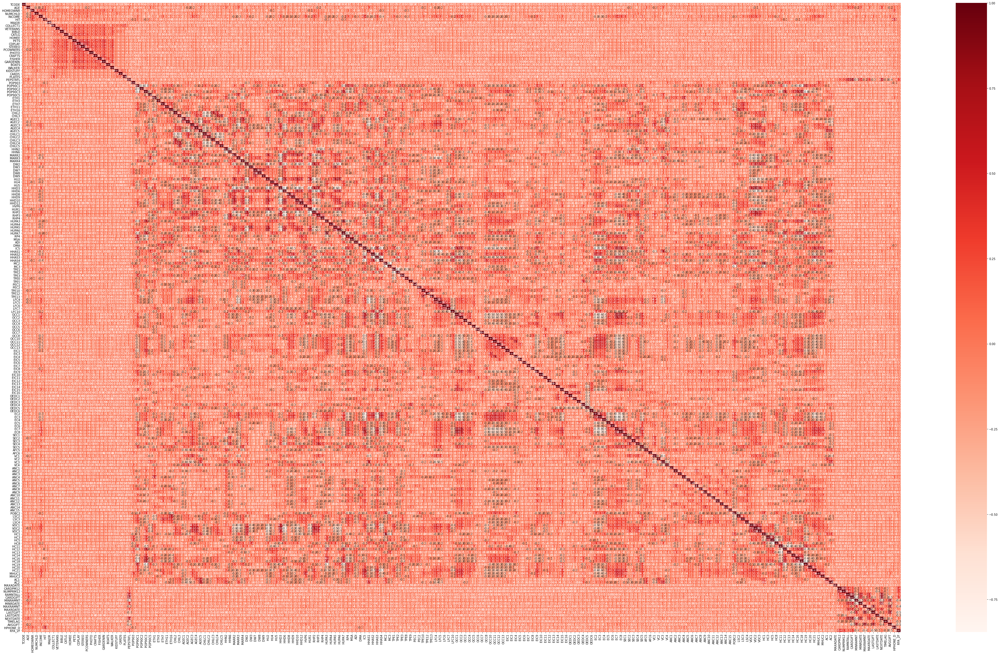

In [142]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(68,40))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = numeric_data.corr(method ='spearman')
cor_heatmap(cor_spearman)

#do this after the split in different types and see which ones can be dropped


In [66]:
#df1.drop(['NEXTDATE', 'AVGGIFT'], axis=1, inplace=True)  #high corr with 3 other variables

In [143]:
std_data.shape[0]/data.shape[0] 

0.9736720747914308

In [144]:
std_data.describe(include='all')

,TCODE,STATE,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,HPHONE_D,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A
count,92900.000000,92900,92900.000000,92900.000000,92900.000000,92900.000000,92900,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900.000000,92900,92900,9290

In [353]:
print(std_data.columns.tolist())

['TCODE', 'STATE', 'AGE', 'HOMEOWNR', 'NUMCHLD', 'INCOME', 'GENDER', 'HIT', 'COLLECT1', 'VETERANS', 'BIBLE', 'CATLG', 'HOMEE', 'PETS', 'CDPLAY', 'STEREO', 'PCOWNERS', 'PHOTO', 'CRAFTS', 'FISHER', 'GARDENIN', 'BOATS', 'WALKER', 'KIDSTUFF', 'CARDS', 'PLATES', 'PEPSTRFL', 'POP903', 'POP90C1', 'POP90C2', 'POP90C3', 'POP90C5', 'ETH1', 'ETH3', 'ETH7', 'ETH11', 'ETH16', 'CHIL2', 'CHIL3', 'AGEC1', 'AGEC2', 'AGEC3', 'AGEC4', 'AGEC5', 'CHILC1', 'CHILC2', 'CHILC3', 'CHILC4', 'CHILC5', 'HHN2', 'HHN6', 'MARR2', 'MARR3', 'MARR4', 'DW2', 'DW3', 'DW7', 'DW8', 'DW9', 'HU2', 'HU4', 'HU5', 'HHD3', 'HHD6', 'HHD8', 'HHD9', 'HHD10', 'HHD12', 'HVP6', 'HUR1', 'RHP2', 'RHP3', 'RHP4', 'HUPA3', 'HUPA4', 'HUPA5', 'HUPA6', 'HUPA7', 'RP4', 'MSA', 'ADI', 'DMA', 'IC5', 'HHAS1', 'HHAS2', 'HHAS3', 'HHAS4', 'MC2', 'MC3', 'TPE1', 'TPE2', 'TPE3', 'TPE8', 'TPE9', 'PEC1', 'PEC2', 'TPE10', 'TPE12', 'TPE13', 'LFC4', 'LFC5', 'LFC6', 'LFC7', 'LFC10', 'OCC1', 'OCC2', 'OCC3', 'OCC4', 'OCC5', 'OCC6', 'OCC7', 'OCC8', 'OCC10', 'OCC1

#demographic: 'AGE', 'NUMCHLD', 'STATE', 'HOMEOWNR', 'GENDER', 'INCOME'


#summary:  'MAXADATE', 'CARDPM12', 'NUMPRM12', 'RAMNTALL', 'CARDGIFT', 'MINRAMNT', 'MINRDATE', 'MAXRAMNT', 'MAXRDATE', 'LASTGIFT', 'LASTDATE', 'NEXTDATE', 'TIMELAG', 'AVGGIFT', 'RFA_2F',  'RFA_2A', 'MAJOR'


#census: 'POP903', 'POP90C1', 'POP90C2', 'POP90C3', 'POP90C5', 'ETH1', 'ETH3', 'ETH7', 'ETH11', 'ETH16', 'CHIL2', 'CHIL3', 'AGEC1', 'AGEC2', 'AGEC3', 'AGEC4', 'AGEC5', 'CHILC1', 'CHILC2', 'CHILC3', 'CHILC4', 'CHILC5', 'HHN2', 'HHN6', 'MARR2', 'MARR3', 'MARR4', 'DW2', 'DW3', 'DW7', 'DW8', 'DW9', 'HU2', 'HU4', 'HU5', 'HHD3', 'HHD6', 'HHD8', 'HHD9', 'HHD10', 'HHD12', 'HVP6', 'HUR1', 'RHP2', 'RHP3', 'RHP4', 'HUPA3', 'HUPA4', 'HUPA5', 'HUPA6', 'HUPA7', 'RP4', 'MSA', 'ADI', 'DMA', 'IC5', 'HHAS1', 'HHAS2', 'HHAS3', 'HHAS4', 'MC2', 'MC3', 'TPE1', 'TPE2', 'TPE3', 'TPE8', 'TPE9', 'PEC1', 'PEC2', 'TPE10', 'TPE12', 'TPE13', 'LFC4', 'LFC5', 'LFC6', 'LFC7', 'LFC10', 'OCC1', 'OCC2', 'OCC3', 'OCC4', 'OCC5', 'OCC6', 'OCC7', 'OCC8', 'OCC10', 'OCC11', 'OCC12', 'OCC13', 'EIC1', 'EIC3', 'EIC4', 'EIC5', 'EIC6', 'EIC7', 'EIC8', 'EIC9', 'EIC10', 'EIC11', 'EIC12', 'EIC13', 'EIC14', 'EIC15', 'EIC16', 'OEDC1', 'OEDC2', 'OEDC3', 'OEDC4', 'OEDC5', 'OEDC6', 'EC2', 'EC3', 'EC4', 'EC5', 'EC6', 'EC7', 'EC8', 'SEC1', 'SEC2', 'SEC3', 'SEC4', 'SEC5', 'AFC5', 'AFC6', 'VC1', 'VC2', 'VC3', 'VC4', 'ANC1', 'ANC2', 'ANC3', 'ANC4', 'ANC5', 'ANC6', 'ANC7', 'ANC8', 'ANC9', 'ANC10', 'ANC11', 'ANC12', 'ANC13', 'ANC14', 'ANC15', 'POBC2', 'LSC2', 'LSC3', 'LSC4', 'VOC1', 'VOC2', 'VOC3', 'HC1', 'HC3', 'HC5', 'HC8', 'HC11', 'HC12', 'HC13', 'HC14', 'HC16', 'HC18', 'HC19', 'HC20', 'HC21', 'MHUC1', 'MHUC2', 'AC1', 'AC2'    

-PCA?


#interests:  'HIT', 'COLLECT1', 'VETERANS', 'BIBLE', 'CATLG', 'HOMEE', 'PETS', 'CDPLAY', 'STEREO', 'PCOWNERS', 'PHOTO', 'CRAFTS', 'FISHER', 'GARDENIN', 'BOATS', 'WALKER', 'KIDSTUFF', 'CARDS', 'PLATES', 'PEPSTRFL'

In [145]:
std_data.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Float64Index: 92900 entries, 95515.0 to 185114.0
Data columns (total 215 columns):
TCODE       92900 non-null float64
STATE       92900 non-null object
AGE         92900 non-null float64
HOMEOWNR    92900 non-null float64
NUMCHLD     92900 non-null float64
INCOME      92900 non-null float64
GENDER      92900 non-null object
HIT         92900 non-null float64
MAJOR       92900 non-null float64
COLLECT1    92900 non-null float64
VETERANS    92900 non-null float64
BIBLE       92900 non-null float64
CATLG       92900 non-null float64
HOMEE       92900 non-null float64
PETS        92900 non-null float64
CDPLAY      92900 non-null float64
STEREO      92900 non-null float64
PCOWNERS    92900 non-null float64
PHOTO       92900 non-null float64
CRAFTS      92900 non-null float64
FISHER      92900 non-null float64
GARDENIN    92900 non-null float64
BOATS       92900 non-null float64
WALKER      92900 non-null float64
KIDSTUFF    92900 non-null float64
CARDS 

In [232]:
std_data[categorical_data]


#state??

,STATE,RFA_2A,MDMAUD_F
CONTROLN,,,
95515.0,IL,E,0
148535.0,CA,G,0
15078.0,NC,E,0
172556.0,CA,E,0
7112.0,FL,F,0
...,...,...,...
184568.0,AK,G,0
122706.0,TX,F,0
189641.0,MI,E,0


### Outliers

In [233]:
import seaborn as sns
from math import ceil

In [292]:
numeric_data = std_data.select_dtypes(include=[np.number]).copy()

In [293]:
numeric_data.drop(['TCODE','HOMEOWNR','GENDER',
 'COLLECT1',
 'VETERANS',
 'BIBLE',
 'CATLG',
 'HOMEE',
 'PETS',
 'CDPLAY',
 'STEREO',
 'PCOWNERS',
 'PHOTO',
 'CRAFTS',
 'FISHER',
 'GARDENIN',
 'BOATS',
 'WALKER',
 'KIDSTUFF',
 'CARDS',
 'PLATES',
 'PEPSTRFL',
 'HPHONE_D',
 'MDMAUD_R',
 'MDMAUD_A', 'HPHONE_D'], axis=1, inplace=True)

In [294]:
numeric_data

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515.0,0.073944,0.0,-0.343742,0.000000,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.0,-0.5,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.493677,-0.472700,-0.552850,1.5
148535.0,-0.676056,1.0,0.753623,5.333333,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,0.0,1.5,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25,0.0,0.0,0.5,-0.333333,-0.6,0.714286,-0.019342,0.888889,-0.401316,1.0,0.000000,-0.445625,1.733233,0.572139,0.5
15078.0,0.106785,0.0,-0.318882,0.666667,2.630847,-1.000000,2.0,1.814815,0.000000,0.200000,0.0,0.0,0.0,-0.5,0.166667,0.666667,0.2,-0.250,-0.1428

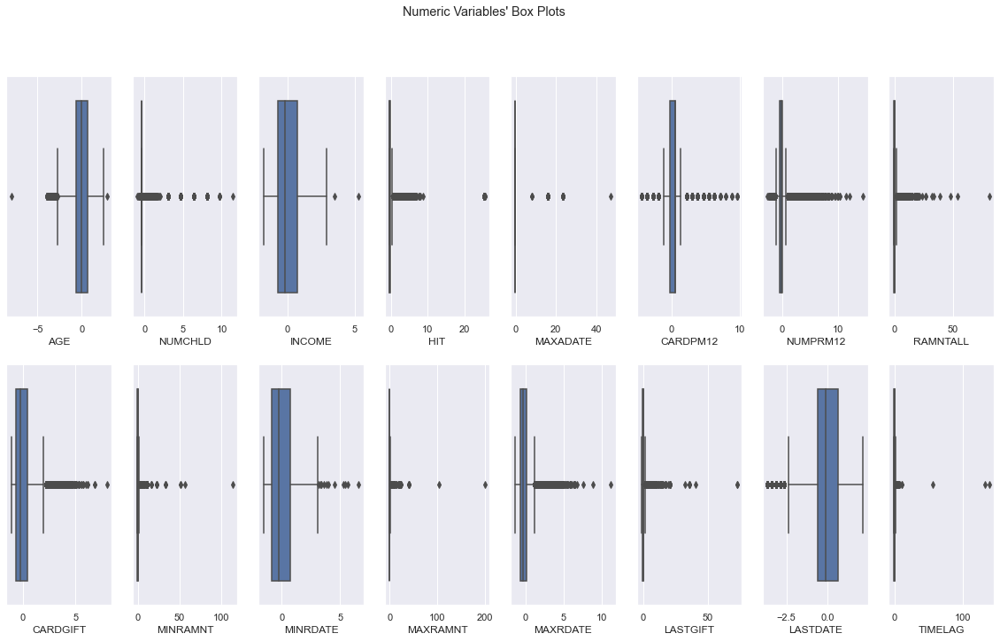

In [105]:
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(numeric_data.columns) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), numeric_data.columns): # Notice the zip() function and flatten() method
    sns.boxplot(df[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

plt.show()

#fazer isto quando fizer o split

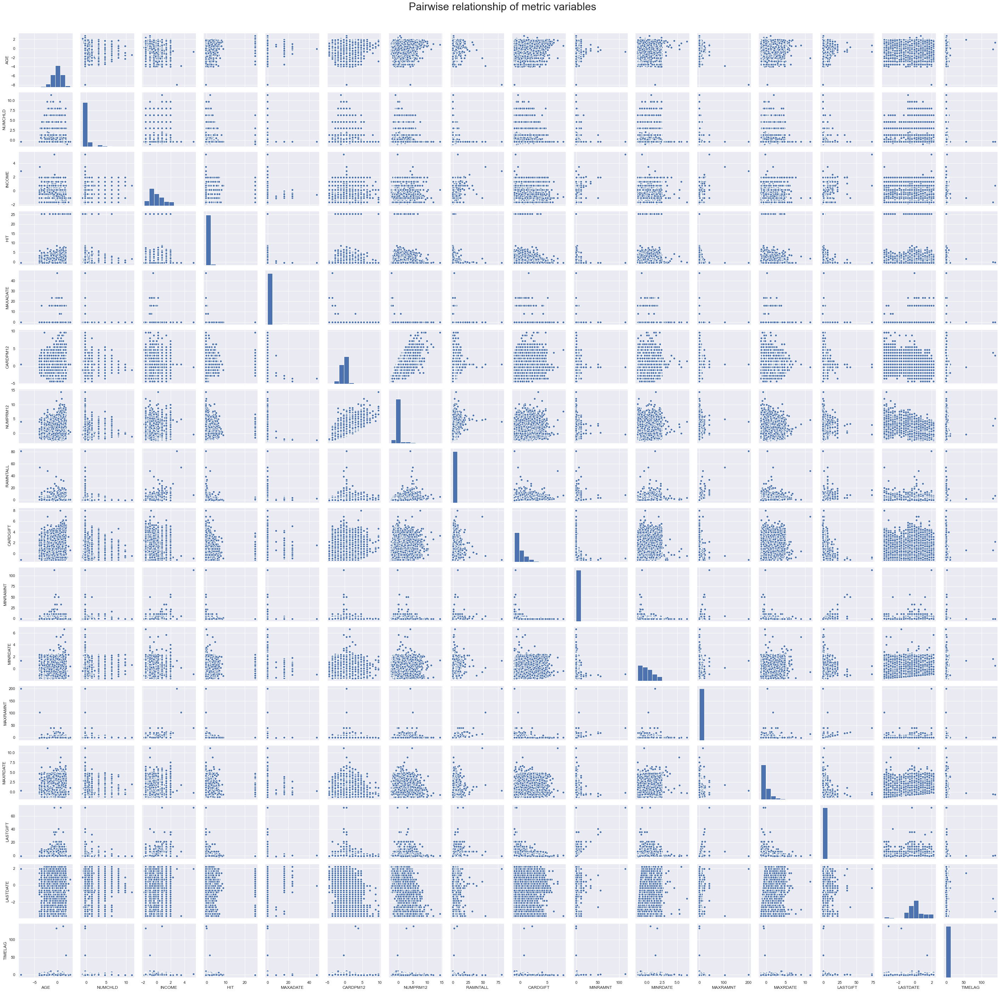

In [106]:
sns.set()

# Setting pairgrid
g = sns.PairGrid(numeric_data)

# Populating pairgrid
mdg = g.map_diag(plt.hist, edgecolor="w")
mog = g.map_offdiag(plt.scatter, edgecolor="w", s=40)
    
# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise relationship of metric variables", fontsize=30)

plt.show()

#fazer isto quando fizer o split

In [295]:
df_outliers = numeric_data.copy()

In [296]:
q25 = df_outliers.quantile(.25)
q75 = df_outliers.quantile(.75)
iqr = (q75 - q25) * 2.5

upper_lim = q75 + 7 * iqr
lower_lim = q25 - 7 * iqr

filters = []
for metric in numeric_data:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters.append(df_outliers[metric].between(llim, ulim, inclusive=True))

df_outliers2 = df_outliers[np.all(filters, 0)]
print('Percentage of data kept after removing outliers:', np.round(df_outliers2.shape[0] / data.shape[0], 4))

#too much data lost

Percentage of data kept after removing outliers: 0.1538


### PCA

### Take outliers with PCA
https://www.dummies.com/programming/big-data/data-science/python-for-data-science-developing-a-multivariate-approach-to-find-outliers/
https://stats.stackexchange.com/questions/328109/k-means-does-it-make-sense-to-remove-the-outliers-after-clustering-the-datasets

In [321]:
df_pca1 = numeric_data.copy()

In [322]:
df_pca1

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515.0,0.073944,0.0,-0.343742,0.000000,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.0,-0.5,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.493677,-0.472700,-0.552850,1.5
148535.0,-0.676056,1.0,0.753623,5.333333,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,0.0,1.5,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25,0.0,0.0,0.5,-0.333333,-0.6,0.714286,-0.019342,0.888889,-0.401316,1.0,0.000000,-0.445625,1.733233,0.572139,0.5
15078.0,0.106785,0.0,-0.318882,0.666667,2.630847,-1.000000,2.0,1.814815,0.000000,0.200000,0.0,0.0,0.0,-0.5,0.166667,0.666667,0.2,-0.250,-0.1428

In [323]:
# Use PCA to reduce dimensionality of data
pca = PCA()
pca_feat = pca.fit_transform(df_pca1)
pca_feat  

array([[ 2.15829725e+01, -2.74017988e+00,  5.06006027e+00, ...,
         7.14627968e-03, -4.44832662e-02, -3.63378878e-04],
       [-1.58424468e+01,  4.45990205e+01, -3.28489558e+00, ...,
        -2.89652084e-04, -4.31749637e-03,  1.19347678e-03],
       [-1.14432497e+01, -5.30411053e+00,  1.63341745e+00, ...,
        -2.96240406e-03, -1.42007389e-02,  4.06685273e-03],
       ...,
       [-1.35312615e+01, -4.34459606e+00, -1.60898525e+00, ...,
        -1.98608267e-02,  1.81811323e-02, -1.85114968e-03],
       [-1.37699001e+01,  1.48977311e+00,  3.40769145e+00, ...,
         3.14869342e-03, -1.38393305e-02, -1.92988521e-04],
       [-1.37271241e+01, -2.04603099e+00, -2.77710290e+00, ...,
         2.67820732e-02, -8.34477783e-03, -9.23260305e-03]])

In [324]:
# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,985.096925,0.000000,6.860057e-01,0.686006
2,86.790517,-898.306409,6.043952e-02,0.746445
3,55.599181,-31.191336,3.871838e-02,0.785164
4,22.479051,-33.120129,1.565405e-02,0.800818
5,19.235393,-3.243659,1.339522e-02,0.814213
6,17.157506,-2.077887,1.194821e-02,0.826161
7,15.324141,-1.833365,1.067149e-02,0.836833
8,12.942607,-2.381534,9.013024e-03,0.845846
9,11.327198,-1.615408,7.888079e-03,0.853734
10,10.814073,-0.513125,7.530747e-03,0.861264


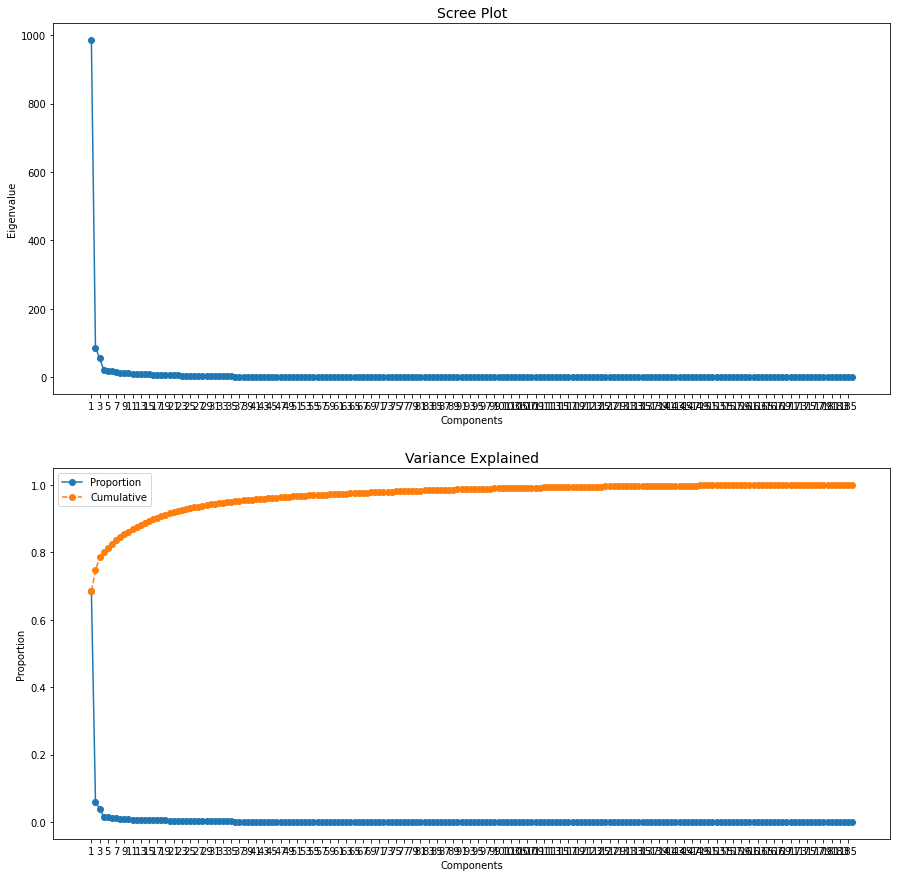

In [325]:
%matplotlib inline
# figure and axes
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 15))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

#6

In [326]:
pca = PCA(n_components=10)
pca_feat = pca.fit_transform(df_pca1)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=df_pca1.index, columns=pca_feat_names)  # remember index=df_pca.index
pca_df

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
CONTROLN,,,,,,,,,,
95515.0,21.582972,-2.740180,5.060060,-4.711522,-1.412119,-3.722459,-0.402279,-2.920910,0.146925,-0.928573
148535.0,-15.842447,44.599020,-3.284896,-0.478089,2.808801,-0.797062,-0.862146,-5.881201,3.216486,-2.537050
15078.0,-11.443250,-5.304111,1.633418,-4.167193,4.929937,-1.369638,-0.277132,-1.845175,-3.577322,1.227055
172556.0,-5.767897,0.625285,1.538297,5.476697,8.163576,-1.086835,-0.060531,-6.046403,-3.596715,0.919920
7112.0,-13.516517,-4.313960,-1.694836,1.674336,-1.260581,-0.135512,-2.748044,0.799804,1.321700,-1.406649
...,...,...,...,...,...,...,...,...,...,...
184568.0,-13.622317,-3.298820,-1.564364,3.358132,-0.096676,0.448549,0.220068,1.142470,6.073249,-0.617861
122706.0,-13.888703,-0.499193,-2.956290,-2.201906,-1.592870,1.841317,0.078226,-3.363777,3.507496,-1.486715
189641.0,-13.531261,-4.344596,-1.608985,2.376160,-1.470191,0.115082,-0.681285,-1.643307,0.851154,-1.596829


In [327]:
# Reassigning df to contain pca variables
df_pca1 = pd.concat([df_pca1, pca_df], axis=1)  #df_pca1 em vez disto se calhar devia ser df_[numerical_data] - para nao incluir a normalizacao
df_pca1.head()

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515.0,0.073944,0.0,-0.343742,0.000000,-0.323641,-1.0,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.0,-0.5,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.5,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.50,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.493677,-0.472700,-0.552850,1.5,21.582972,-2.740180,5.060060,-4.711522,-1.412119,-3.722459,-0.402279,-2.920910,0.146925,-0.928573
148535.0,-0.676056,1.0,0.753623,5.333333,0.518331,0.0,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,0.0,1.5,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.0,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.25,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25,0.0,0.0,0.5,-0.333333,-0.6,0.714286,-0.019342,0.888889,-0.401316,1.0,0.000000,-0.445625,1.733233,0.572139,0.5,-15.84244

In [328]:
metric_features = numeric_data.columns.tolist()

In [329]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_pca1[metric_features + pca_feat_names].corr().loc[metric_features, pca_feat_names]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
AGE,0.0508547,0.0189778,0.0200789,-0.0370141,-0.0159922,-0.0260052,-0.0123419,0.125706,-0.101015,-0.00095419
NUMCHLD,-0.0034887,-0.0285508,-0.0332878,-0.00765679,-0.019289,0.0120379,-0.0232361,-0.0679799,0.0528885,-0.0512434
INCOME,-0.0802955,0.259496,-0.0887224,-0.14249,-0.103837,0.0834042,-0.0340424,-0.0877818,0.230173,-0.0470722
HIT,0.00936148,0.00960001,-0.0112245,-0.0331115,-0.124758,0.0290328,-0.0802064,0.123389,0.123349,-0.139662
POP903,0.0135165,0.0313845,0.0218176,0.101852,-0.0234548,-0.00633601,0.0160976,-0.0466857,-0.00370538,0.0788592
POP90C1,-0.546075,0.194838,0.0274147,0.307231,-0.47416,-0.012659,-0.00627175,0.146343,0.196797,-0.116404
POP90C2,0.999897,0.0132184,-0.00484593,0.00119494,-0.000516982,0.000636454,0.000139859,-0.000189031,0.000382216,-4.0679e-05
POP90C3,-0.132179,-0.2397,-0.0343289,-0.3685,0.543786,0.0113236,0.00656285,-0.181145,-0.234019,0.137435
POP90C5,0.0986766,0.0064966,-0.14866,0.00920444,-0.228032,-0.054939,-0.00831111,0.323547,-0.139985,0.0434382
ETH1,0.0626559,-0.0192553,-0.119909,-0.623746,-0.0940021,0.18443,-0.009744,0.134016,-0.0134968,0.011584


In [330]:
df = df_pca1.copy()

In [331]:
df_pca2 = pd.concat([df_pca1, df_[categorical_data]], axis=1)
df_pca2

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,STATE,RFA_2A,MDMAUD_F
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515.0,0.073944,0.0,-0.343742,0.000000,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.0,-0.5,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.493677,-0.472700,-0.552850,1.5,21.582972,-2.740180,5.060060,-4.711522,-1.412119,-3.722459,-0.402279,-2.920910,0.146925,-0.928573,IL,E,X
148535.0,-0.676056,1.0,0.753623,5.333333,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,0.0,1.5,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25,0.0,0.0,0.5,-0.333333,-0.6,0.714286,-0.019342,0.888889,-0.401316,1.0,0.00

In [332]:
# Do this after checking the new pandas profiling report
#df_pca2.drop(columns=['PC14', 'PC17', 'PC19'], inplace=True)

KeyError: "['PC14' 'PC17' 'PC19'] not found in axis"

In [334]:
pc_features = df_pca2.columns[df_pca2.columns.str.startswith('PC')] #.drop(['PCOWNERS'])


In [335]:
df_pca2[pc_features]

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
CONTROLN,,,,,,,,,,
95515.0,21.582972,-2.740180,5.060060,-4.711522,-1.412119,-3.722459,-0.402279,-2.920910,0.146925,-0.928573
148535.0,-15.842447,44.599020,-3.284896,-0.478089,2.808801,-0.797062,-0.862146,-5.881201,3.216486,-2.537050
15078.0,-11.443250,-5.304111,1.633418,-4.167193,4.929937,-1.369638,-0.277132,-1.845175,-3.577322,1.227055
172556.0,-5.767897,0.625285,1.538297,5.476697,8.163576,-1.086835,-0.060531,-6.046403,-3.596715,0.919920
7112.0,-13.516517,-4.313960,-1.694836,1.674336,-1.260581,-0.135512,-2.748044,0.799804,1.321700,-1.406649
...,...,...,...,...,...,...,...,...,...,...
184568.0,-13.622317,-3.298820,-1.564364,3.358132,-0.096676,0.448549,0.220068,1.142470,6.073249,-0.617861
122706.0,-13.888703,-0.499193,-2.956290,-2.201906,-1.592870,1.841317,0.078226,-3.363777,3.507496,-1.486715
189641.0,-13.531261,-4.344596,-1.608985,2.376160,-1.470191,0.115082,-0.681285,-1.643307,0.851154,-1.596829


https://www.dummies.com/programming/big-data/data-science/python-for-data-science-developing-a-multivariate-approach-to-find-outliers/

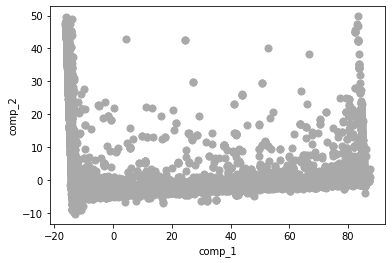

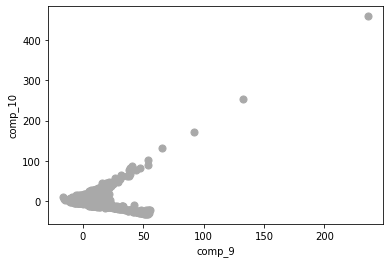

In [337]:
df9 = pd.DataFrame(pca_feat, columns=['comp_'+str(j+1) for j in range(10)])
first_two = df9.plot(kind='scatter', x='comp_1', y='comp_2', c='DarkGrey', s=50)
last_two = df9.plot(kind='scatter', x='comp_9', y='comp_10', c='DarkGrey', s=50)

Looking at these two scatterplots of the first and last components. Looking at the data points along the axis, it can be seen a possible threshold to use for separating regular data from suspect data (possible outliers).

Using the two last components that we kept, it can be located a few points to investigate using the threshold of 1.4 for the last component and of 1.3 for the nith. All cases above these values are possible outliers.


In [338]:
df

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515.0,0.073944,0.0,-0.343742,0.000000,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.0,-0.5,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.493677,-0.472700,-0.552850,1.5,21.582972,-2.740180,5.060060,-4.711522,-1.412119,-3.722459,-0.402279,-2.920910,0.146925,-0.928573
148535.0,-0.676056,1.0,0.753623,5.333333,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,0.0,1.5,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25,0.0,0.0,0.5,-0.333333,-0.6,0.714286,-0.019342,0.888889,-0.401316,1.0,0.000000,-0.445625,1.733233,0.572139

In [478]:
outlying = (pca_feat[:,-1] < 1.4) & (pca_feat[:,-4] < 1.3)
df[outlying]

,TCODE,ZIP,AGE,HOMEOWNR,NUMCHLD,INCOME,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,HPHONE_D,neighborhood,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515.0,0.000000,0.607178,0.743880,0,0.034987,0.190859,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.352941,0.168831,0.023965,0.341463,0.005,0.207807,0.001401,0.140621,0.010,0.608819,0.294014,0.003676,0.006465,0.0,0.000000,-0.677444,0.062497,0.757889,0.007975,-0.040880,-0.237865,0.344144,-0.091935,-0.008740,0.010019,-0.000912,-0.051874
148535.0,0.000014,0.912843,0.650172,1,0.172846,0.369372,0.066390,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.352941,0.155844,0.003590,0.024390,0.010,0.153992,0.004004,0.054914,0.025,0.608819,0.086870,0.016544,0.014399,0.0,0.000016,-0.252854,0.425412,-0.406133,-0.710884,-0.034807,-0.253801,0.342075,-0.069838,-0.063686,0.008318,0.020931,0.089111
148547.0,0.000000,0.912843,0.693902,1,0.034987,0.295498,0.058091,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.352941,0.155844,0.007179,0.097561,0.005,0.261748,0.002402,0.101745,0.015,0.564723,0.395746,0.003676,0.010299,0.0,0.000016,1.810615,0.965619,0.258717,-0.222261,-0.255158,0.162664,0.624863,0.129161,-0.830310,-0.518526,-0.052868,-0.209777
15078.0,0.000014,0.262916,0.750084,0,0.034987,0.147749,0.008299,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.352941,0.168831,0.019954,0.341463,0.002,0.242420,0.002202,0.215037,0.005,0.608819,0.259880,0.011029,0.006204,1.0,0.000033,-0.482755,-0.612179,0.294936,0.595848,-0.058737,-0.251875,0.345427,-0.110201,0.060588,0.049397,-0.039081,-0.174987
15079.0,0.000000,0.262916,0.587700,0,0.172846,0.221623,0.000000,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.352941,0.155844,0.008024,0.073171,0.010,0.323017,0.003203,0.046959,0.021,0.520626,0.297137,0.007353,0.013565,0.0,0.000033,-0.034319,0.271155,0.898198,0.179378,-0.428710,-0.122062,0.363501,-0.267162,0.302164,0.057717,0.343122,-0.206707
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47945.0,0.000000,0.350194,0.721837,0,0.034987,0.159829,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.352941,0.168831,0.002745,0.048780,0.008,0.096261,0.001201,0.054914,0.011,0.608819,0.090328,0.001838,0.008475,0.0,0.999934,-0.645648,0.703725,-0.070740,0.147174,0.072725,0.300617,-0.475956,0.104805,0.079400,0.015512,-0.032031,-0.131457
84678.0,0.000000,0.555140,0.725138,1,0.034987,0.221623,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.235294,0.090909,0.013302,0.146341,0.003,0.319480,0.003003,0.148576,0.020,0.564723,0.259880,0.009191,0.010311,0.0,0.999951,-0.286609,-0.255229,0.379733,-0.758290,-0.003603,0.272995,-0.492699,0.135934,0.040229,0.005580,-0.009302,-0.045341
156106.0,0.000389,0.925527,0.748325,0,0.034987,0.221218,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.352941,0.155844,0.007073,0.048780,0.025,0.069480,0.005005,0.101745,0.025,0.782361,0.100367,0.017463,0.025414,0.0,0.999967,-0.650508,0.737479,-0.063683,0.100853,0.030897,0.299703,-0.466653,0.083829,-0.074688,-0.049369,0.038816,0.138831


In [339]:
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from sklearn.base import clone
from sklearn.metrics import pairwise_distances
from scipy.cluster.hierarchy import dendrogram
from sklearn.manifold import TSNE
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from collections import Counter

https://www.datasciencelearner.com/projection-detecting-outliers-dbscan-method/

In [342]:
# Based on the hyperparameters found in the previous class
dbscan = DBSCAN(eps=5, min_samples=20, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df_pca2[pc_features])
Counter(dbscan_labels)

#outliers -1: 5774 com 2.9 e min_samples=20
# 12479 com 2.9 e min_samples=40
#5495com 3.5 e min_samples=20   - 4477

SystemError: <built-in function dbscan_inner> returned a result with an error set

In [302]:
df_pca2[dbscan_labels==-1]

ValueError: Item wrong length 60919 instead of 92900.

In [301]:
# Save the newly detected outliers (they will be classified later based on the final clusters)
df_out = df_pca2[dbscan_labels==-1].copy()

# New df without outliers and 'rcn'
df_pca2 = df_pca2[dbscan_labels!=-1]\
    .copy()



ValueError: Item wrong length 60919 instead of 92900.

In [106]:
df_pca2

,TCODE,ZIP,AGE,HOMEOWNR,NUMCHLD,INCOME,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,TIMELAG,HPHONE_D,neighborhood,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,OSOURCE,STATE,MDMAUD,DOMAIN,GENDER,MDMAUD_R,MDMAUD_F,MDMAUD_A
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515.0,-0.056970,-0.131590,0.099933,-1.115082,-0.348656,-0.506185,-0.359020,-0.053988,-0.241506,-0.351785,-0.321761,-0.301171,-0.097001,-0.422783,-0.385865,-0.395201,-0.353155,-0.230759,-0.307861,-0.285877,-0.406973,-0.147949,-0.353271,-0.128797,-0.105309,-0.0771,1.055394,-0.0598,0.542223,0.261230,1.179848,1.988119,-0.335993,0.124481,-0.318102,0.447548,-0.538674,-0.094611,-0.524058,-1.019149,-1.541107,-1.746919,2.145093,-0.422989,0.068301,0.011819,0.805650,-1.370403,0.105288,-0.181357,-0.726256,0.494264,0.515213,-0.789701,-0.916917,0.088321,-0.210198,0.014329,0.224788,0.108600,0.308293,GRI,IL,XXXX,T2,F,X,X,X
148535.0,-0.055920,1.131586,-0.914065,0.896795,1.334499,1.357668,1.353154,-0.053988,-0.241506,-0.351785,-0.321761,-0.301171,-0.097001,-0.422783,-0.385865,-0.395201,-0.353155,-0.230759,-0.307861,-0.285877,-0.406973,-0.147949,-0.353271,-0.128797,-0.105309,-0.0771,-0.947513,-0.0598,0.542223,0.039197,-0.488116,-0.895707,0.236290,-0.315103,0.204673,-0.628497,0.573859,-0.094611,1.268380,-1.019149,-1.541049,-0.569159,-1.695333,1.050758,-0.844739,0.240825,-2.056312,-0.255034,1.308584,0.769771,-0.001295,1.243064,0.784370,-0.916666,0.194368,-0.044112,0.254964,-0.841962,0.670088,-0.050891,0.425285,BOA,CA,XXXX,S1,M,X,X,X
148547.0,-0.056970,1.131586,-0.440866,0.896795,-0.348656,0.765370,1.139132,-0.053988,-0.241506,2.842646,-0.321761,-0.301171,-0.097001,2.365280,2.591578,2.530358,2.831617,-0.230759,-0.307861,-0.285877,2.457163,-0.147949,2.830690,-0.128797,-0.105309,-0.0771,-0.947513,-0.0598,0.542223,0.039197,-0.194277,-0.230209,-0.335993,0.565096,-0.117035,-0.040538,-0.167830,-0.352161,-0.524058,-1.019149,-1.541049,5.017742,0.296742,0.253834,-0.360100,-1.607898,-0.283913,-0.414486,2.463806,-0.483175,-0.952619,0.012892,1.249300,-0.431753,0.473408,-0.589421,-1.198756,1.708242,1.164358,-0.529078,0.388202,BHG,CA,XXXX,S1,F,X,X,X
15078.0,-0.055920,-1.554266,0.080193,-1.115082,-0.348656,-0.419225,-0.144999,-0.053988,-0.241506,-0.351785,-0.321761,-0.301171,-0.097001,-0.422783,-0.385865,-0.395201,-0.353155,-0.230759,-0.307861,-0.285877,-0.406973,-0.147949,-0.353271,-0.128797,-0.105309,-0.0771,1.055394,-0.0598,0.542223,0.261230,0.851441,1.988119,-0.679363,0.407218,-0.157248,1.381838,-0.909519,-0.094611,0.500192,0.981211,-1.540991,-1.615425,2.591653,-0.902871,0.454226,0.053314,0.003671,-0.088597,-0.813959,-0.527011,0.402238,1.032376,0.223378,-1.017659,-1.433668,0.619343,-0.596619,0.240746,0.182264,0.889575,-0.036650,AMH,NC,XXXX,R2,M,X,X,X
15079.0,-0.056970,-1.554266,-1.590064,-1.115082,1.334499,0.173073,-0.359020,-0.053988,-0.241506,-0.351785,-0.321761,3.320369,-0.097001,-0.422783,-0.385865,-0.395201,2.831617,-0.230759,-0.307861,3.498010,-0.406973,-0.147949,-0.353271,-0.128797,-0.105309,-0.0771,1.055394,-0.0598,0.542223,0.039197,-0.125139,-0.452042,0.236290,1.065562,0.043819,-0.728370,0.277184,-0.609711,-0.011933,-1.019149,-1.540991,1.451263,0.063666,0.403770,-0.336869,-0.265220,-0.218131,-2.512913,-1.430294,-0.127909,0.668370,1.345891,-0.321813,-0.990353,-1.629647,-0.212137,-0.950667,0.075604,0.948678,-1.280888,0.545914,BHG,NC,XXXX,R2,F,X,X,X
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47945.0,-0.056970,-1.193585,-0.160444,-1.115082,-0.348656,-0.680081,-0.359020,-0.053988,-0.241

In [303]:
df_pca2[pc_features]

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC15,PC16,PC18
CONTROLN,,,,,,,,,,,,,,,,,
95515.0,-1.746873,2.145076,-0.421548,0.071450,0.014100,0.808486,-1.368334,0.134907,-0.171827,-0.714645,0.172427,0.729790,-0.641092,-0.993480,-0.142218,0.060894,0.249595
148535.0,-0.569197,-1.694881,1.050618,-0.832671,0.274501,-2.037516,-0.245218,1.400511,0.799919,-0.021548,0.811335,1.142470,-0.605262,-0.009087,0.305026,0.604822,0.538322
148547.0,5.017778,0.295748,0.254530,-0.366922,-1.593325,-0.289863,-0.413736,2.359916,-0.409661,-1.005597,-0.123318,1.340761,-0.519186,0.526726,-1.469418,-2.093215,-0.059414
15078.0,-1.615439,2.591082,-0.902910,0.447896,0.056594,-0.004121,-0.082721,-0.868551,-0.509606,0.379570,0.860921,0.726907,-0.961492,-1.541451,-0.419080,0.174212,0.722734
15079.0,1.451328,0.064182,0.399365,-0.338617,-0.291272,-0.247090,-2.529474,-1.493698,-0.083392,0.565281,1.419475,0.073509,-0.941042,-2.137123,-0.234118,-0.873742,1.146521
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47945.0,-1.416877,-1.196655,-0.424397,-1.323887,-0.107855,1.206517,-0.353800,-1.208998,-0.323524,0.571471,-0.874159,-1.314082,0.662526,0.452306,-0.314155,-0.384065,-0.210784
84678.0,-1.252867,0.525380,-0.535101,1.388497,0.087689,-0.418293,-0.438260,-0.222034,0.389406,0.583703,-0.478075,-0.987041,0.660644,1.344172,0.380063,-0.441404,-0.700526
156106.0,-1.437056,-1.930014,1.321903,-0.080283,-0.168650,1.170019,-0.235513,0.905019,0.959910,1.250808,-0.529813,-1.110950,0.670874,1.208254,-0.059961,0.129673,1.090705


## Testing on K-means and Hierarchical clustering


In [108]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst
    
def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust


# Set up the clusterers
kmeans = KMeans(
    init='k-means++',
    n_init=20,
    random_state=42
)

hierarchical = AgglomerativeClustering(
    affinity='euclidean'
)

### Defining the linkage method to choose

In [119]:
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
    The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    def get_ss(df):
        ss = np.sum(df.var() * (df.count() - 1))
        return ss  # return sum of sum of squares of each df variable
    
    sst = get_ss(df)  # get total sum of squares
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        hclabels = cluster.fit_predict(df) #get cluster labels
        df_concat = pd.concat((df, pd.Series(hclabels, name='labels')), axis=1)  # concat df with labels
        ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
        ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
        r2.append(ssb / sst)  # save the R2 of the given cluster solution
        
    return np.array(r2)

In [121]:
df_pca2[pc_features]

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC15,PC16,PC17,PC18
CONTROLN,,,,,,,,,,,,,,,,,,
95515.0,-1.746919,2.145093,-0.422989,0.068301,0.011819,0.805650,-1.370403,0.105288,-0.181357,-0.726256,0.494264,0.515213,-0.789701,-0.916917,-0.210198,0.014329,0.224788,0.108600
148535.0,-0.569159,-1.695333,1.050758,-0.844739,0.240825,-2.056312,-0.255034,1.308584,0.769771,-0.001295,1.243064,0.784370,-0.916666,0.194368,0.254964,-0.841962,0.670088,-0.050891
148547.0,5.017742,0.296742,0.253834,-0.360100,-1.607898,-0.283913,-0.414486,2.463806,-0.483175,-0.952619,0.012892,1.249300,-0.431753,0.473408,-1.198756,1.708242,1.164358,-0.529078
15078.0,-1.615425,2.591653,-0.902871,0.454226,0.053314,0.003671,-0.088597,-0.813959,-0.527011,0.402238,1.032376,0.223378,-1.017659,-1.433668,-0.596619,0.240746,0.182264,0.889575
15079.0,1.451263,0.063666,0.403770,-0.336869,-0.265220,-0.218131,-2.512913,-1.430294,-0.127909,0.668370,1.345891,-0.321813,-0.990353,-1.629647,-0.950667,0.075604,0.948678,-1.280888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47945.0,-1.416831,-1.196196,-0.423718,-1.329455,-0.084533,1.207029,-0.355178,-1.280399,-0.322363,0.494189,-1.128938,-0.906166,0.951535,0.391900,-0.086896,0.285400,-0.284273,-0.071658
84678.0,-1.253031,0.524310,-0.537318,1.380734,0.070808,-0.439913,-0.436108,-0.306769,0.411296,0.572503,-0.761335,-0.667202,0.792761,1.214358,0.646185,0.649990,-0.365363,-0.286419
156106.0,-1.436920,-1.929529,1.322370,-0.084849,-0.155363,1.177920,-0.224524,0.804043,0.989200,1.170894,-0.833034,-0.851862,0.752044,1.195786,-0.028453,0.060222,0.256581,0.966455


In [202]:
# Prepare input
hc_methods = ["ward", "complete", "average", "single"]
# Call function defined above to obtain the R2 statistic for each hc_method
max_nclus = 20
r2_hc_methods = np.vstack([get_r2_hc(df=df_pca2[pc_features], link_method=link, max_nclus=max_nclus) for link in hc_methods]).T
r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

sns.set()
# Plot data
fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

# Finalize the plot
fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
plt.gca().invert_xaxis()  # invert x axis
plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

plt.show()

MemoryError: Unable to allocate 29.1 GiB for an array with shape (3909269253,) and data type float64

### Defining the number of clusters:


In [131]:
range_clusters = range(1, 15)

In [132]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_pca2[pc_features])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

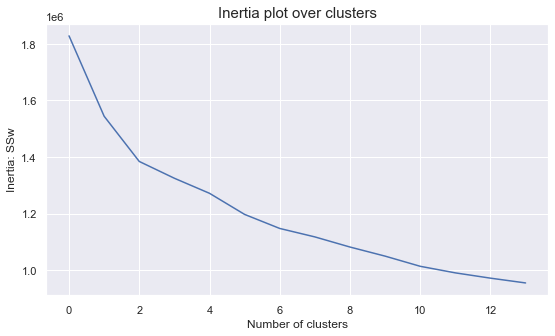

In [133]:
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

In [136]:
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import AgglomerativeClustering, KMeans
from scipy.cluster.hierarchy import dendrogram
import matplotlib.cm as cm

For n_clusters = 2, the average silhouette_score is : 0.2762101708918887
For n_clusters = 3, the average silhouette_score is : 0.1378296606582079
For n_clusters = 4, the average silhouette_score is : 0.13918522014859908
For n_clusters = 5, the average silhouette_score is : 0.10746556568174531
For n_clusters = 6, the average silhouette_score is : 0.10834448309922554
For n_clusters = 7, the average silhouette_score is : 0.11151941579789446
For n_clusters = 8, the average silhouette_score is : 0.09826162156194898
For n_clusters = 9, the average silhouette_score is : 0.1037752800653452
For n_clusters = 10, the average silhouette_score is : 0.08388313933385592
For n_clusters = 11, the average silhouette_score is : 0.08927131645693669
For n_clusters = 12, the average silhouette_score is : 0.09261580147899447
For n_clusters = 13, the average silhouette_score is : 0.08370545743493288
For n_clusters = 14, the average silhouette_score is : 0.0855730412875256


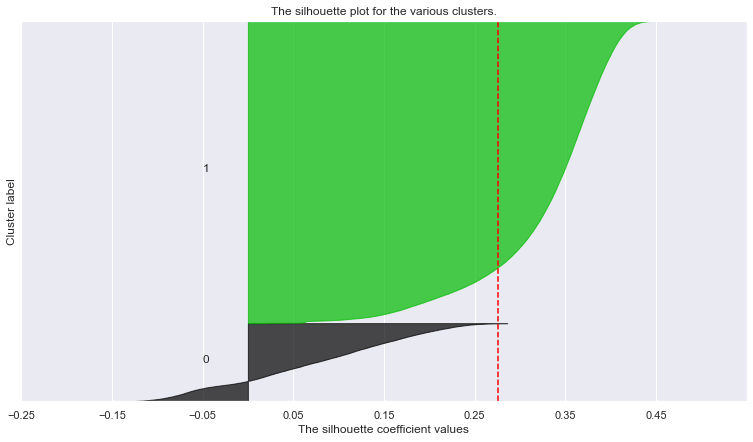

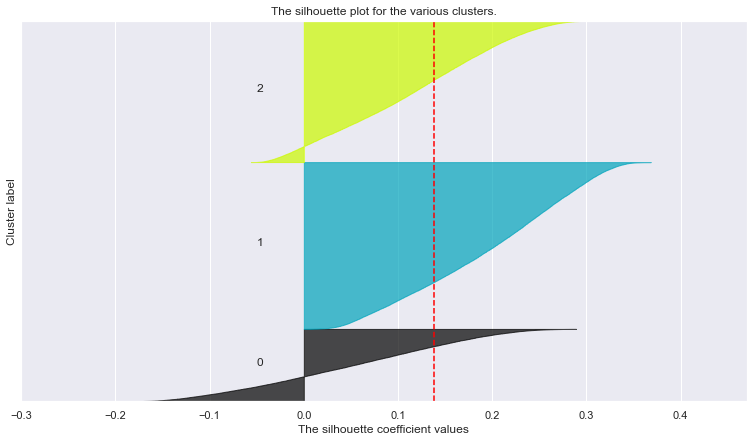

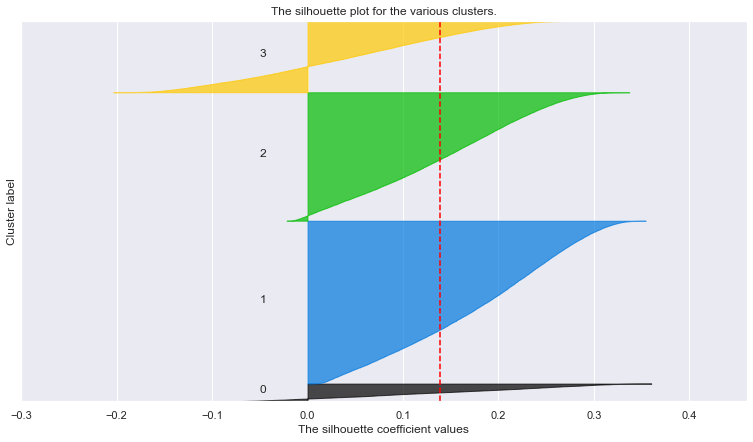

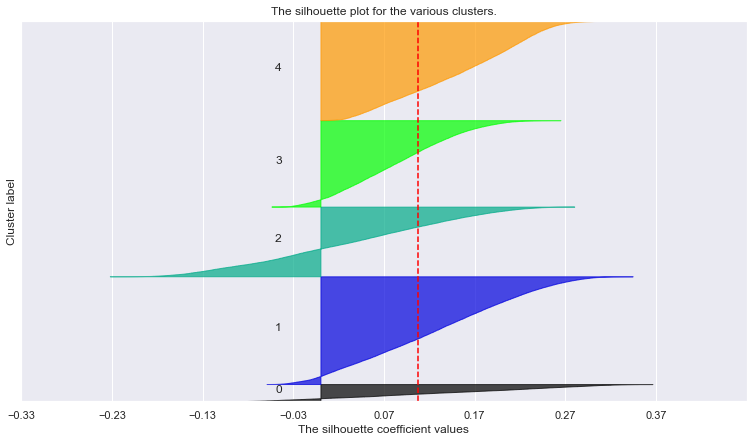

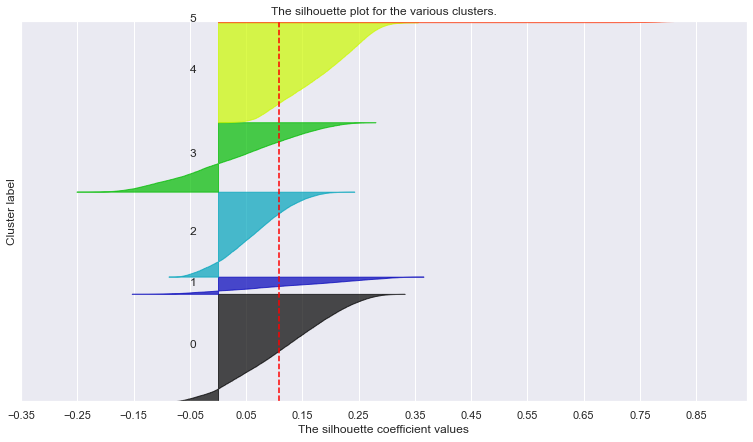

...

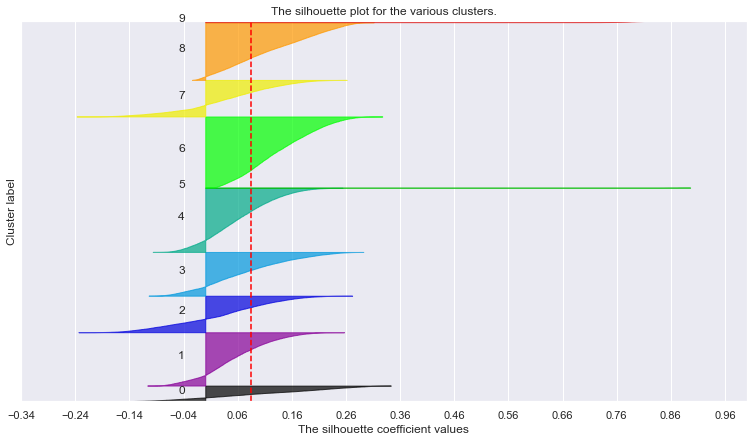

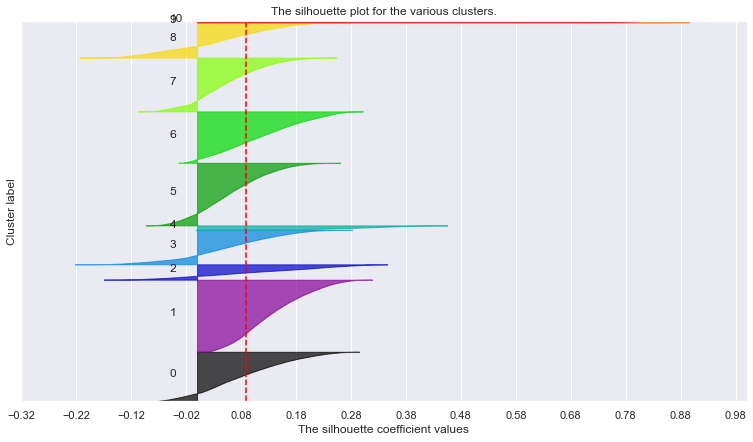

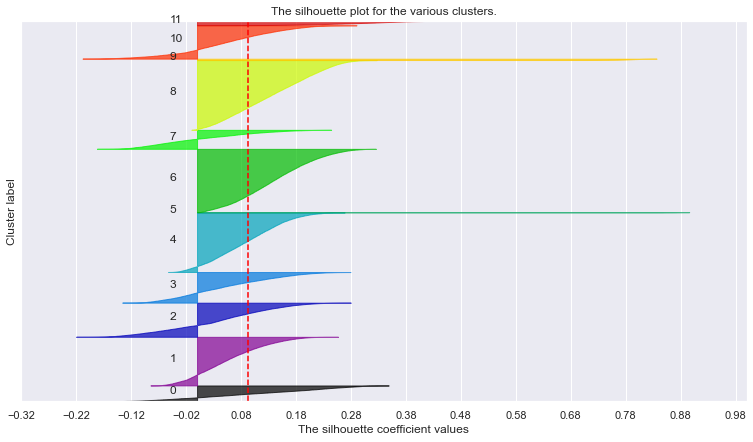

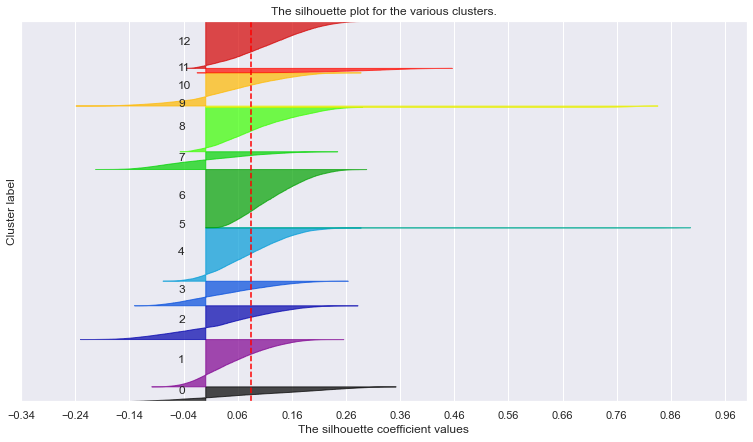

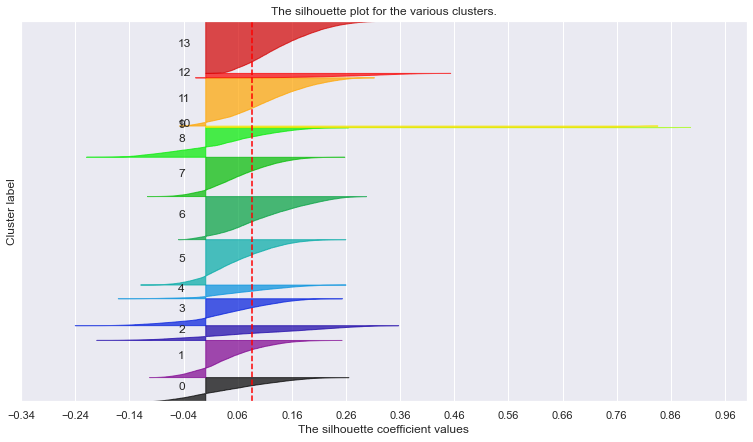

In [137]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_pca2[pc_features])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_pca2[pc_features], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_pca2[pc_features], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_pca2[pc_features]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

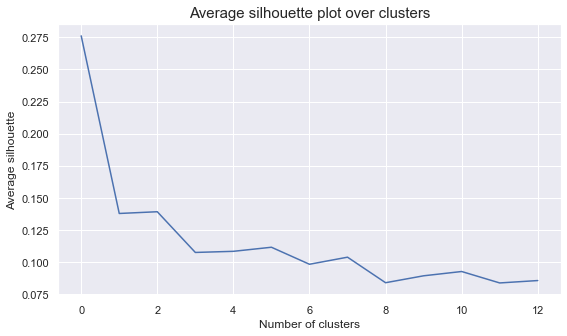

In [138]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

### Finding the optimal clusterer 

In [110]:
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from sklearn.base import clone
from sklearn.metrics import pairwise_distances
from scipy.cluster.hierarchy import dendrogram
from sklearn.manifold import TSNE
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import train_test_split
import graphviz

sns.set()

In [115]:
# Obtaining the R² scores for each cluster solution on demographic variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_pca2[pc_features], kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:  #hierarchical
    r2_scores[linkage] = get_r2_scores(
        df_pca2[pc_features], hierarchical.set_params(linkage=linkage)
    )

pd.DataFrame(r2_scores)

MemoryError: Unable to allocate 29.1 GiB for an array with shape (3909269253,) and data type float64

### Kmeans

In [304]:
# final cluster solution
number_clusters = 4
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels = kmclust.fit_predict(df_pca2[pc_features])
km_labels

array([0, 2, 3, ..., 2, 2, 0])

In [305]:
pc_features

Index(['PC0', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9',
       'PC10', 'PC11', 'PC12', 'PC13', 'PC15', 'PC16', 'PC18'],
      dtype='object')

In [306]:
#anter de fazer isto tenho de fazer inertia e ver numero de clusters

In [307]:
# Characterizing the final clusters
df_concat2 = pd.concat((df_pca2, pd.Series(km_labels, name='labels')), axis=1)
df_concat2.groupby('labels').mean()

,TCODE,ZIP,AGE,HOMEOWNR,NUMCHLD,INCOME,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,TIMELAG,HPHONE_D,neighborhood,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC15,PC16,PC18
labels,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.0,0.004747,-0.778526,-0.002827,0.026228,0.030948,-0.047876,-0.000151,0.027102,0.014551,0.011762,0.048238,0.013873,-0.010045,0.002659,0.006646,0.019113,-0.016129,0.000074,0.037635,0.025121,0.022933,0.007972,0.016034,0.009512,0.001863,-0.006315,0.042699,-0.059800,0.083232,0.193136,0.057291,0.045394,-0.021724,0.027631,0.007712,0.026587,-0.005706,-0.039511,-0.018468,0.117374,0.009287,0.059566,0.192444,0.023642,-0.084905,0.033699,-0.023162,0.180085,-0.547305,-0.169648,0.210603,-0.007937,-0.005522,-0.112059,-0.267811,-0.077200,-0.142616,-0.031608
1.0,-0.035193,-0.756865,0.005818,0.052304,0.049701,-0.046342,-0.029268,0.083617,0.029000,0.058364,0.050844,-0.006083,0.018624,-0.013179,-0.044011,0.009321,-0.030746,-0.022267,-0.044448,0.027111,0.031487,0.073759,0.016226,0.056347,-0.010482,0.019546,0.041577,-0.059800,0.094960,0.176254,0.100958,0.074606,-0.006242,0.048884,0.031169,0.046356,0.060740,0.021928,-0.021067,0.166249,-0.054442,0.035851,0.216944,0.095981,-0.010918,0.083398,-0.052146,0.198401,-0.552929,-0.124188,0.167866,0.024668,-0.020730,-0.157835,-0.318746,-0.046202,-0.175138,-0.042491
2.0,-0.005023,-0.763488,0.009992,0.033856,0.011700,-0.039197,0.005421,0.036369,0.018172,0.020954,0.029097,0.014577,-0.001212,0.000384,0.003756,0.024200,-0.014856,0.014882,0.016315,0.017903,0.013509,0.030507,0.012252,0.001239,-0.004878,0.015022,0.059283,-0.059800,0.086956,0.223129,0.063980,0.074753,-0.047435,0.050387,-0.002924,0.046656,-0.009766,-0.041422,-0.008227,0.103124,0.010268,0.049545,0.244877,0.017967,-0.086864,0.031265,-0.027636,0.171365,-0.517059,-0.150108,0.203409,0.021406,-0.028978,-0.105682,-0.268244,-0.086986,-0.149035,-0.043692
3.0,0.003289,-0.783229,-0.000960,0.034845,0.007113,-0.049635,-0.010023,0.017164,0.013619,0.006531,0.021280,-0.000763,0.003212,-0.001126,-0.011160,-0.013258,-0.015440,-0.003494,0.012022,0.010192,-0.002020,0.001712,0.004219,0.001630,0.010267,-0.015705,0.048680,-0.056336,0.086071,0.208261,0.068140,0.064476,-0.037634,0.030145,0.010937,0.039228,-0.006245,-0.020349,-0.005998,0.094205,-0.004481,0.004993,0.210487,0.020660,-0.075905,0.034613,-0.029210,0.162424,-0.525917,-0.166173,0.214775,0.008740,-0.009623,-0.116912,-0.283038,-0.073385,-0.159795,-0.039820


In [308]:
df_pca2['pc_feature'] = km_labels

In [309]:
df_pca2[pc_features.to_list() +['pc_feature']]

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC15,PC16,PC18,pc_feature
CONTROLN,,,,,,,,,,,,,,,,,,
95515.0,-1.746873,2.145076,-0.421548,0.071450,0.014100,0.808486,-1.368334,0.134907,-0.171827,-0.714645,0.172427,0.729790,-0.641092,-0.993480,-0.142218,0.060894,0.249595,0
148535.0,-0.569197,-1.694881,1.050618,-0.832671,0.274501,-2.037516,-0.245218,1.400511,0.799919,-0.021548,0.811335,1.142470,-0.605262,-0.009087,0.305026,0.604822,0.538322,2
148547.0,5.017778,0.295748,0.254530,-0.366922,-1.593325,-0.289863,-0.413736,2.359916,-0.409661,-1.005597,-0.123318,1.340761,-0.519186,0.526726,-1.469418,-2.093215,-0.059414,3
15078.0,-1.615439,2.591082,-0.902910,0.447896,0.056594,-0.004121,-0.082721,-0.868551,-0.509606,0.379570,0.860921,0.726907,-0.961492,-1.541451,-0.419080,0.174212,0.722734,0
15079.0,1.451328,0.064182,0.399365,-0.338617,-0.291272,-0.247090,-2.529474,-1.493698,-0.083392,0.565281,1.419475,0.073509,-0.941042,-2.137123,-0.234118,-0.873742,1.146521,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47945.0,-1.416877,-1.196655,-0.424397,-1.323887,-0.107855,1.206517,-0.353800,-1.208998,-0.323524,0.571471,-0.874159,-1.314082,0.662526,0.452306,-0.314155,-0.384065,-0.210784,2
84678.0,-1.252867,0.525380,-0.535101,1.388497,0.087689,-0.418293,-0.438260,-0.222034,0.389406,0.583703,-0.478075,-0.987041,0.660644,1.344172,0.380063,-0.441404,-0.700526,0
156106.0,-1.437056,-1.930014,1.321903,-0.080283,-0.168650,1.170019,-0.235513,0.905019,0.959910,1.250808,-0.529813,-1.110950,0.670874,1.208254,-0.059961,0.129673,1.090705,2


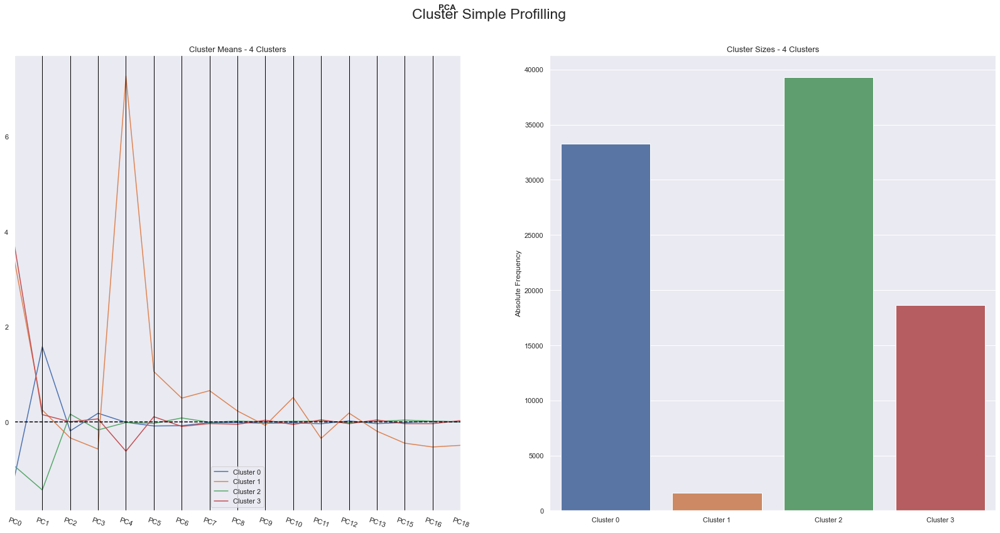

In [310]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    df = df_pca2[pc_features.to_list() +['pc_feature']], 
    label_columns = ['pc_feature'], 
    figsize = (28, 13), 
    compar_titles = ["PCA"]
)


#add boxplot, hist to this


### R2 score

In [311]:
r2(df_pca2[pc_features], km_labels)

0.2527240544705499

In [151]:
prof = ProfileReport(d[categorical_data])
prof.to_file(output_file='profiling2.html')

## References:
Deal with nan values:
https://stackoverflow.com/questions/50670080/mice-implementation-in-python
https://stackoverflow.com/questions/45321406/missing-value-imputation-in-python-using-knn
https://stackoverflow.com/questions/45239256/data-imputation-with-fancyimpute-and-pandas
https://stackoverflow.com/questions/54059964/can-not-use-mice-from-fancyimputer-python


Use mean or median:
https://www.wcc.nrcs.usda.gov/normals/median_average.htm